# Advanced Lane Lines Detection

Introduction goes here

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpim
import os
%matplotlib inline
%load_ext autoreload
%autoreload 2

from lanefinder import LaneFinder as LF

In [2]:
lf = LF()

Initialising LaneFinder
Calibration complete


## Test intermediate results on single frame

240 720
dx: 699.0, rt: 0.9985714285714286


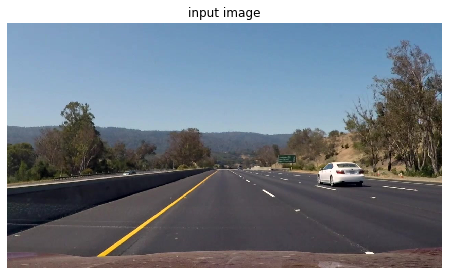

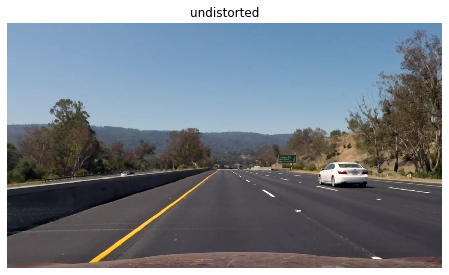

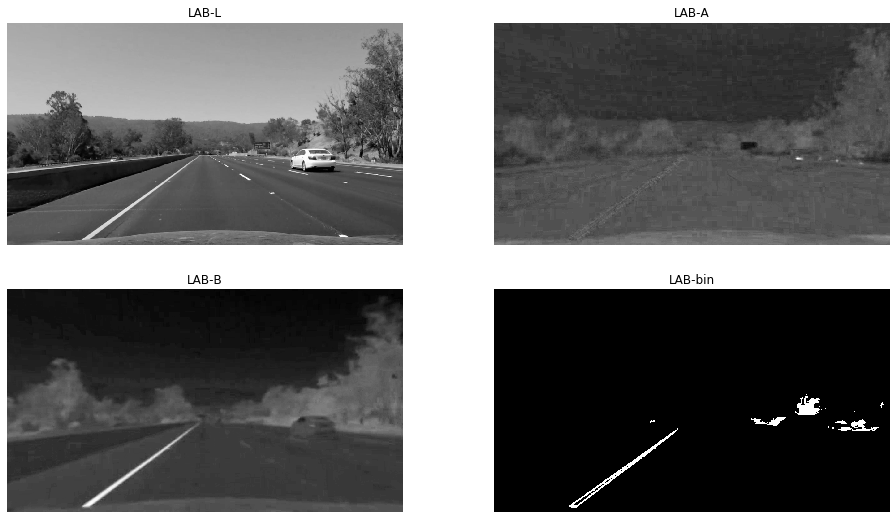

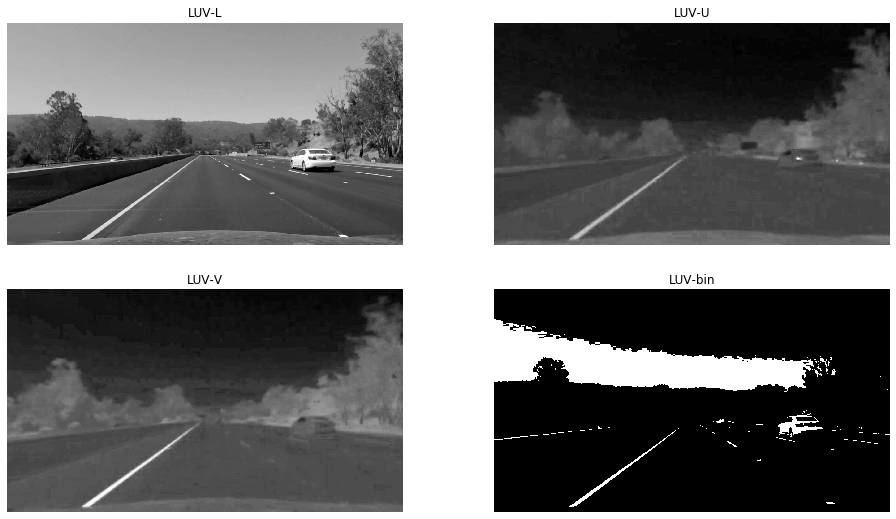

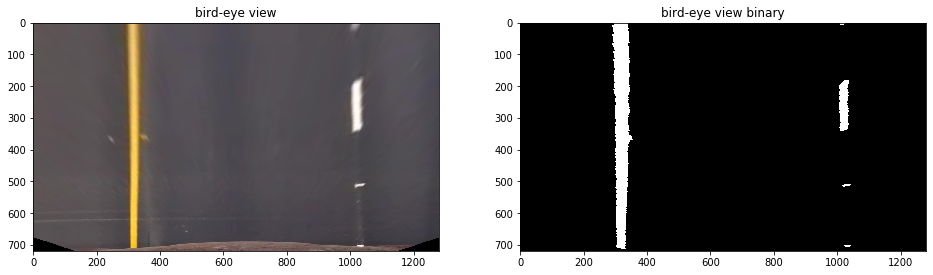

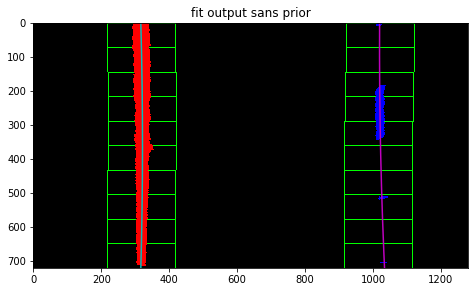

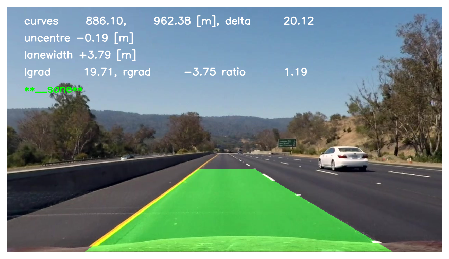

In [28]:
prdir = 'project_frames'
prframes = [os.path.join(prdir, fname) for fname in os.listdir(prdir) if 'jpg' in fname]
imtest = lf.find_lane_lines(mpim.imread(prframes[8]), ignore_prior=True, verbose=True)

## Test prior with another frame

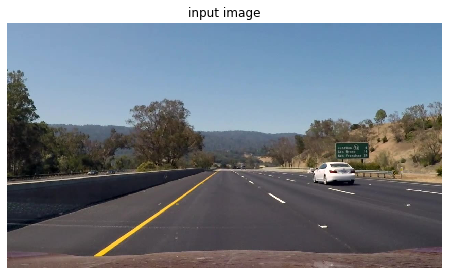

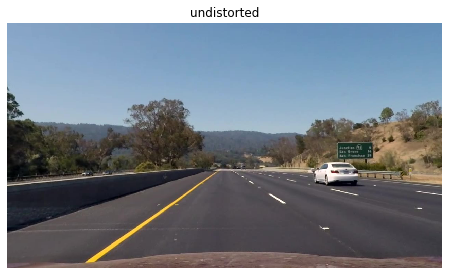

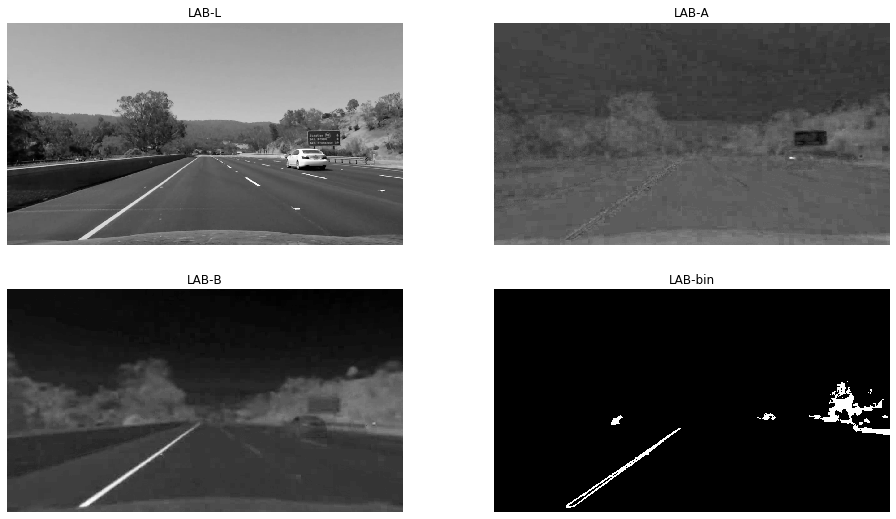

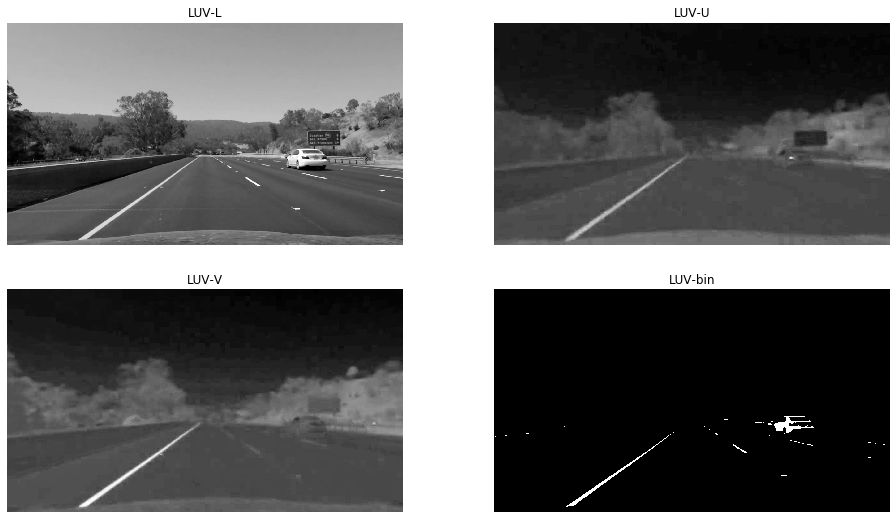

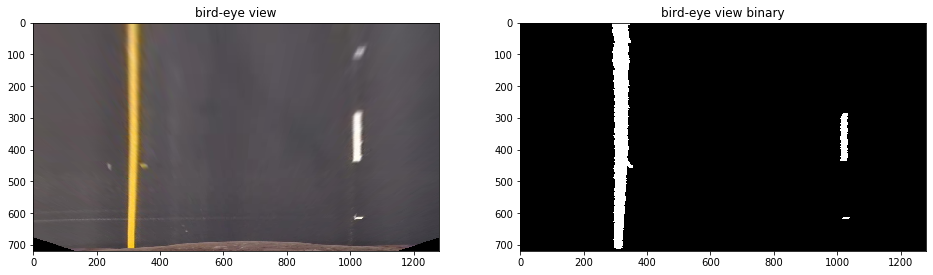

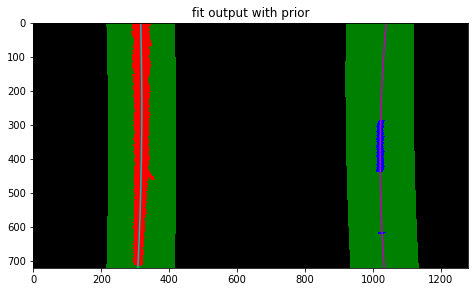

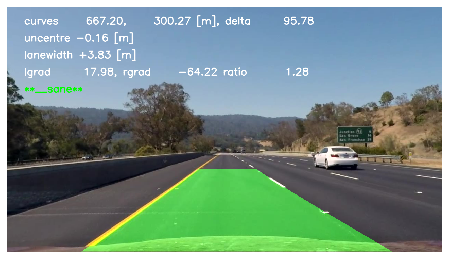

In [4]:
imtest = lf.find_lane_lines(mpim.imread(prframes[9]), ignore_prior=False, verbose=True)

## Test result on all project frames

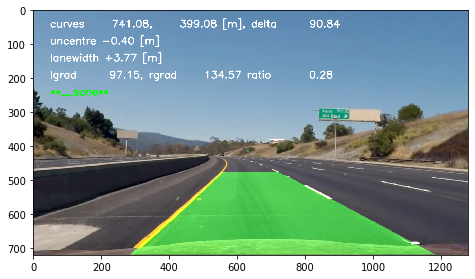

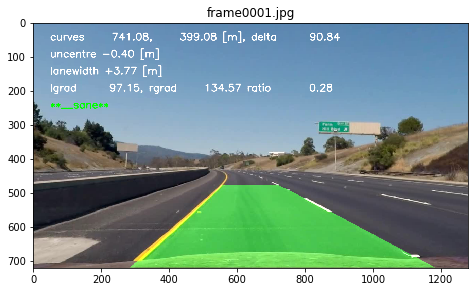

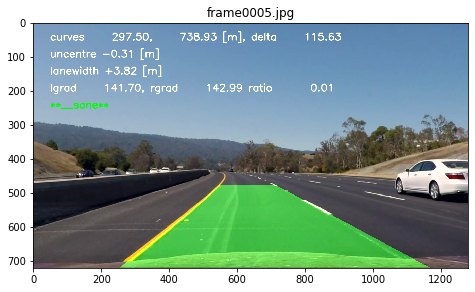

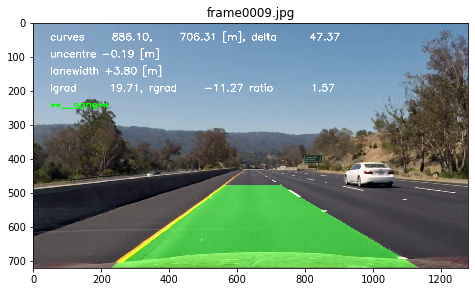

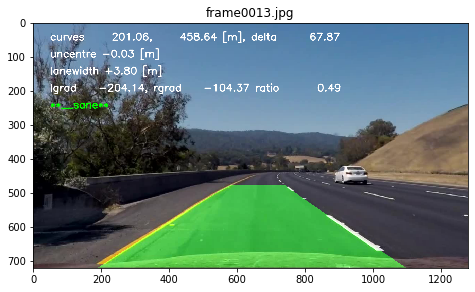

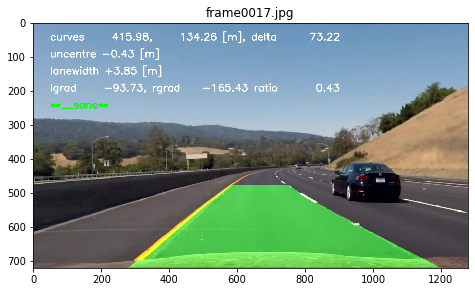

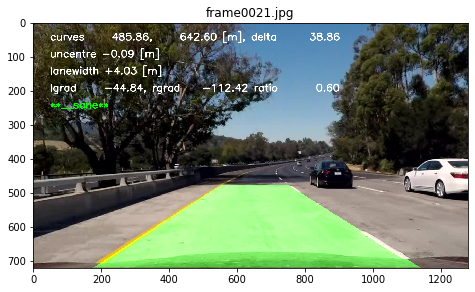

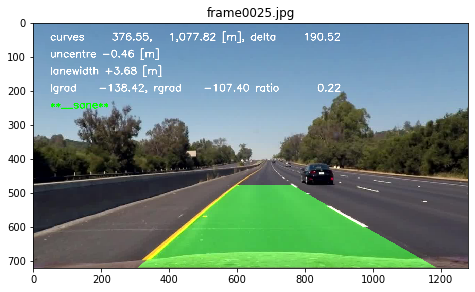

In [5]:
lf.reset()
im = lf.find_lane_lines(mpim.imread(prframes[0]), ignore_prior=True, verbose=False)
plt.figure(figsize=(8, 4.5));plt.imshow(im)
for prframe in prframes[::4]:
    im = lf.find_lane_lines(mpim.imread(prframe), ignore_prior=True, verbose=False)
    plt.figure(figsize=(8, 4.5));plt.imshow(im)
    plt.gca().set_title(os.path.split(prframe)[-1])

## Test on difficult, project-failing frames

In [6]:
diffdir = 'difficult_project_frames'

fnames = [os.path.join(diffdir, fname) for fname in os.listdir(diffdir)]

set_a = [fname for fname in fnames if fname.find('frame_a') > 0]
set_b = [fname for fname in fnames if fname.find('frame_b') > 0]
set_c = [fname for fname in fnames if fname.find('frame_c') > 0]
set_d = [fname for fname in fnames if fname.find('frame_d') > 0]

Initialising LaneFinder
Calibration complete


/home/ryan/anaconda3/envs/carnd-term1/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


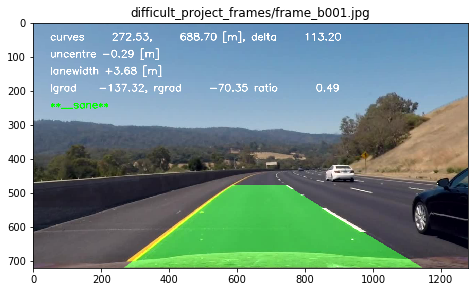

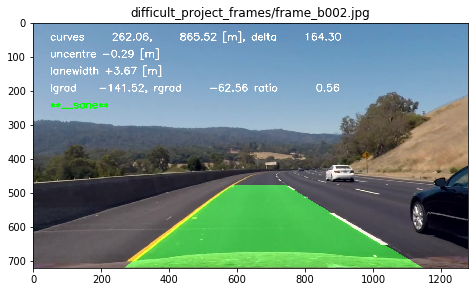

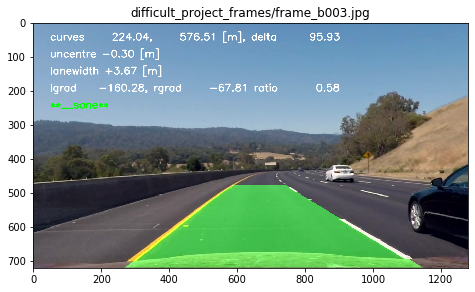

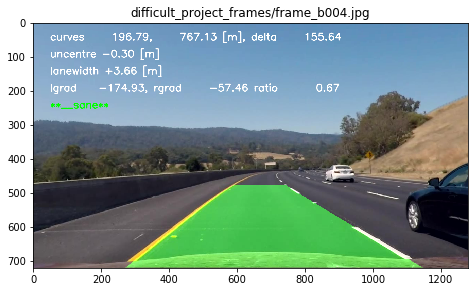

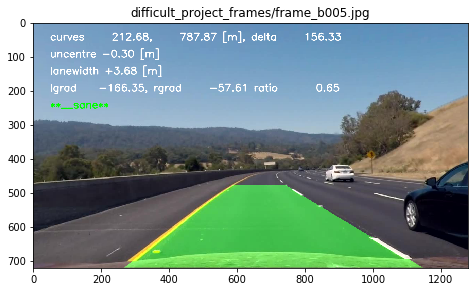

...

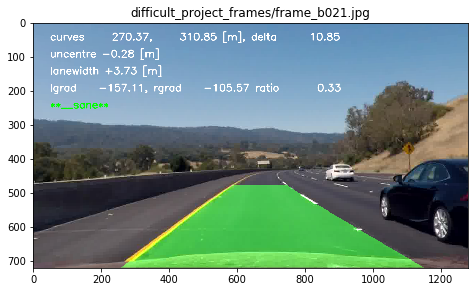

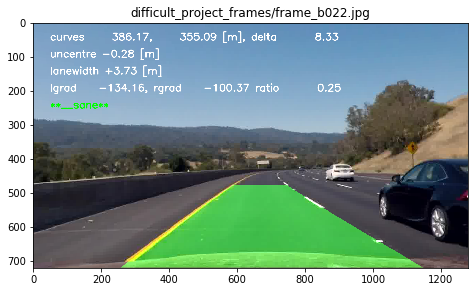

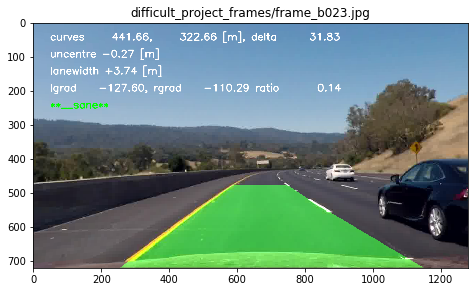

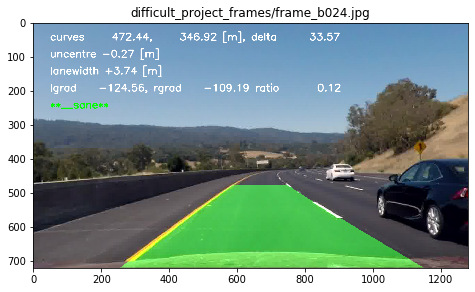

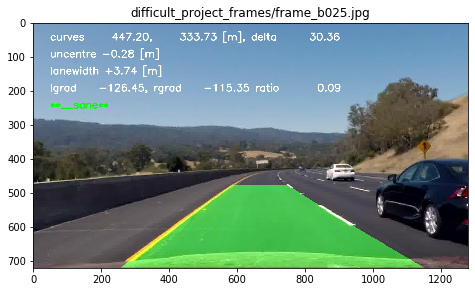

In [7]:
lf = LF()
lf.reset()
lf.has_prior = False
for fname in set_b: # change set name {a, b, c, d} to test on different difficult sequences
    im = mpim.imread(fname)
    imout = lf.find_lane_lines(im, ignore_prior=False, verbose=False)
    plt.figure(figsize=(8, 4.5));plt.imshow(imout);plt.gca().set_title(fname)

240 720
dx: 717.0, rt: 1.0242857142857142


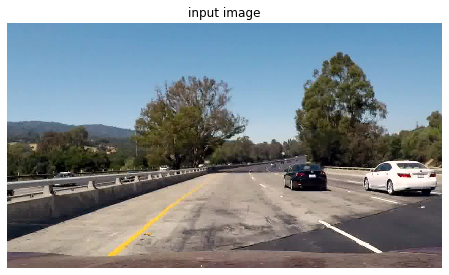

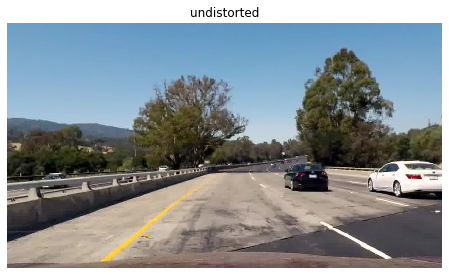

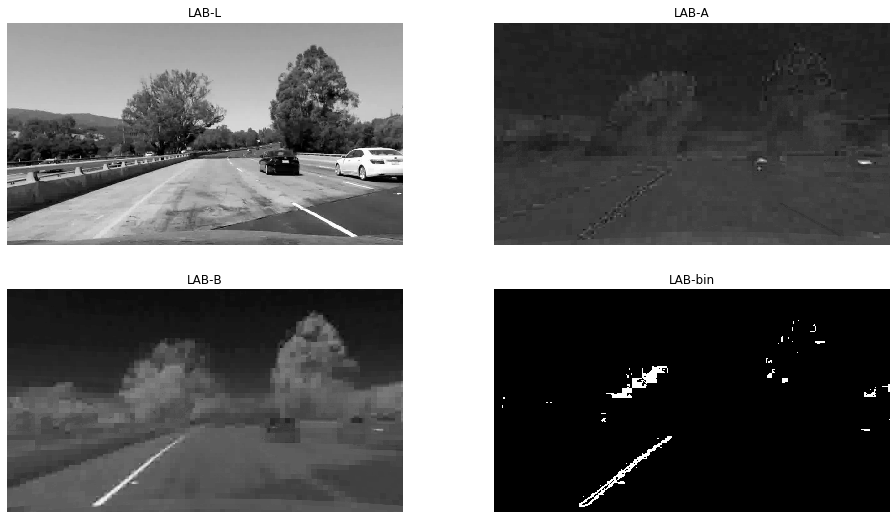

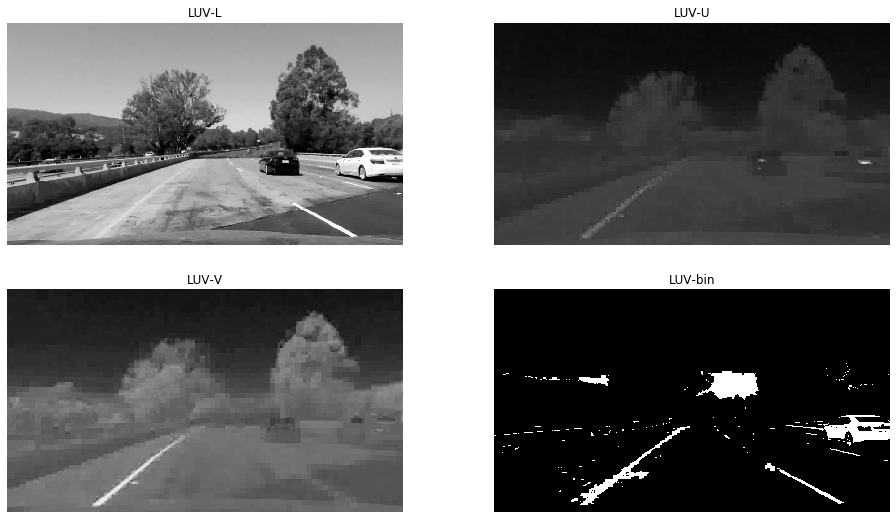

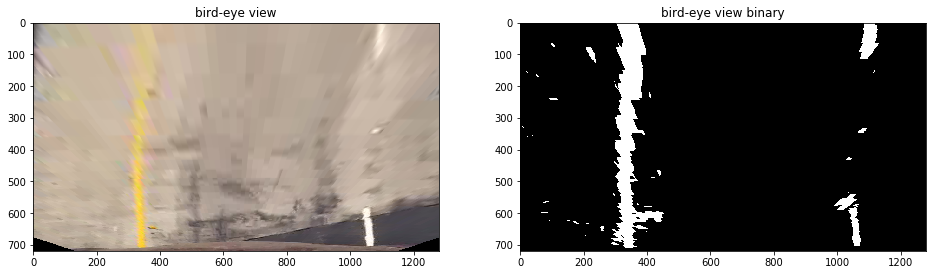

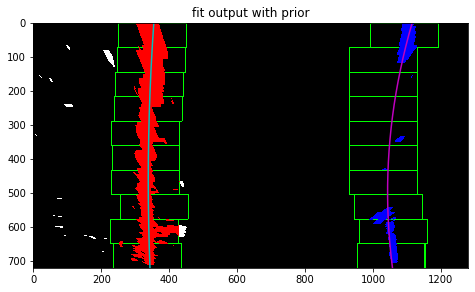

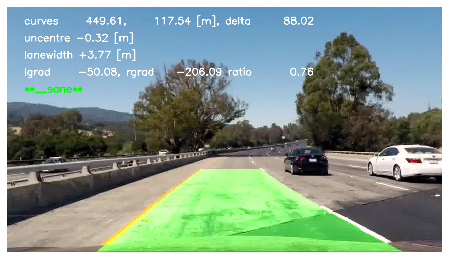

In [8]:
# Verbose test on single frame (choose a difficult one!)

im = mpim.imread(set_c[15])
imout = lf.find_lane_lines(im, ignore_prior=True, verbose=True)

## Video Pipeline

In [9]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [ ]:
lf = LF()

In [ ]:
vin = 'project_video.mp4'
vout = 'vout_project.mp4'

# clipin = VideoFileClip(vin).subclip(15, 30)
clipin = VideoFileClip(vin)
clipout = clipin.fl_image(lf.find_lane_lines)
%time clipout.write_videofile(vout, audio=False)

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(vout))

## Test on challenge video frames

Initialising LaneFinder
Calibration complete


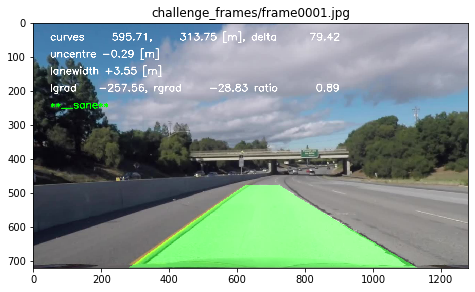

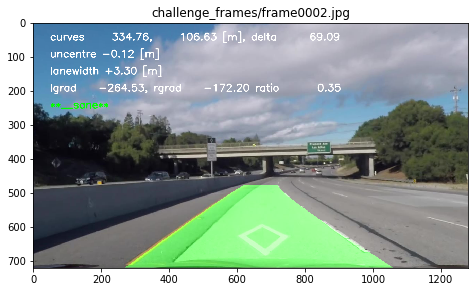

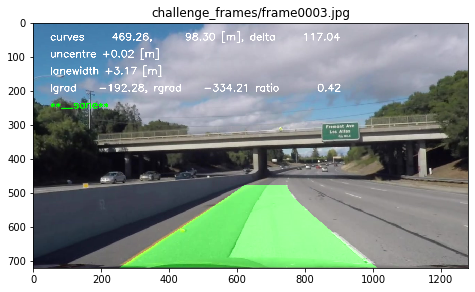

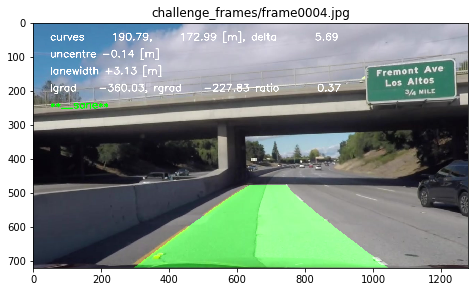

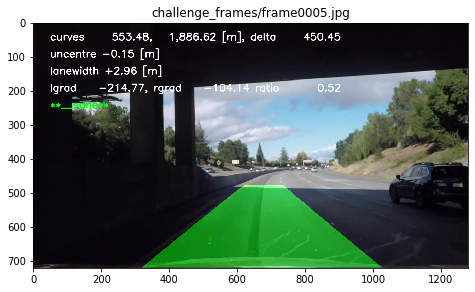

...

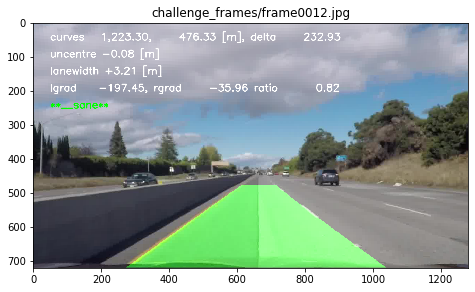

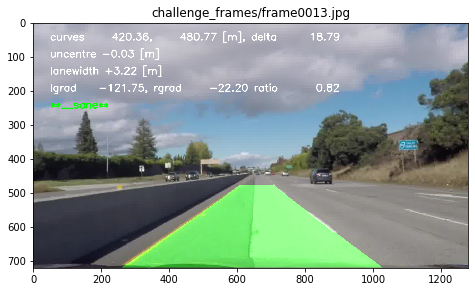

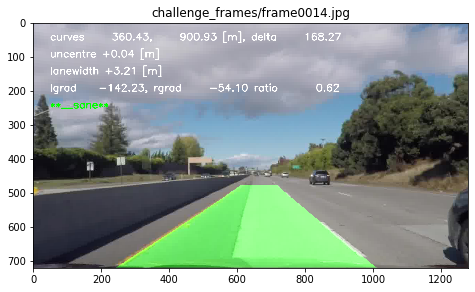

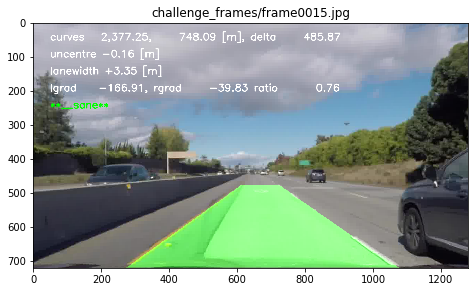

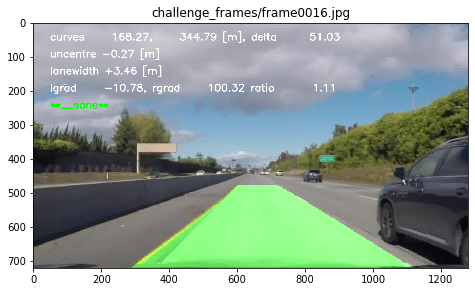

In [11]:
ch_dir = 'challenge_frames'
ch_frames = [os.path.join(ch_dir, fname) for fname in os.listdir(ch_dir)]

lf = LF()
lf.ell_th = (190, 255)
lf.has_prior = False
for fname in ch_frames[0::1]:
    im = mpim.imread(fname)
    imout = lf.find_lane_lines(im, ignore_prior=False, verbose=False)
    plt.figure(figsize=(8, 4.5));plt.imshow(imout);plt.gca().set_title(fname)

240 720
dx: 640.0, rt: 0.9142857142857143
240 720
dx: 554.0, rt: 0.7914285714285714


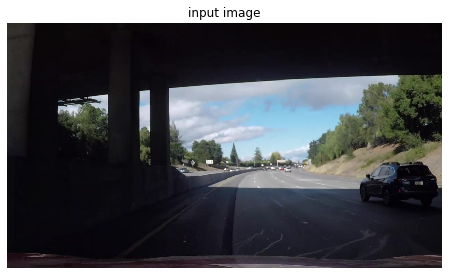

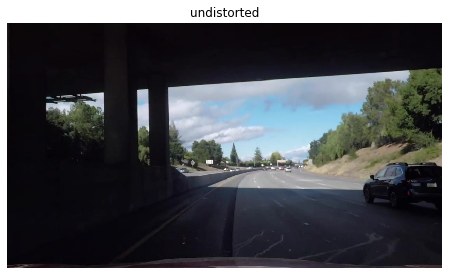

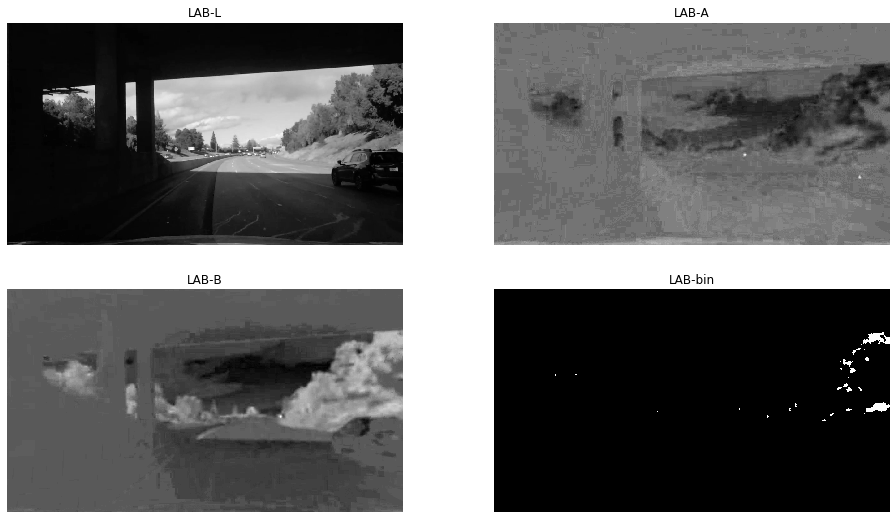

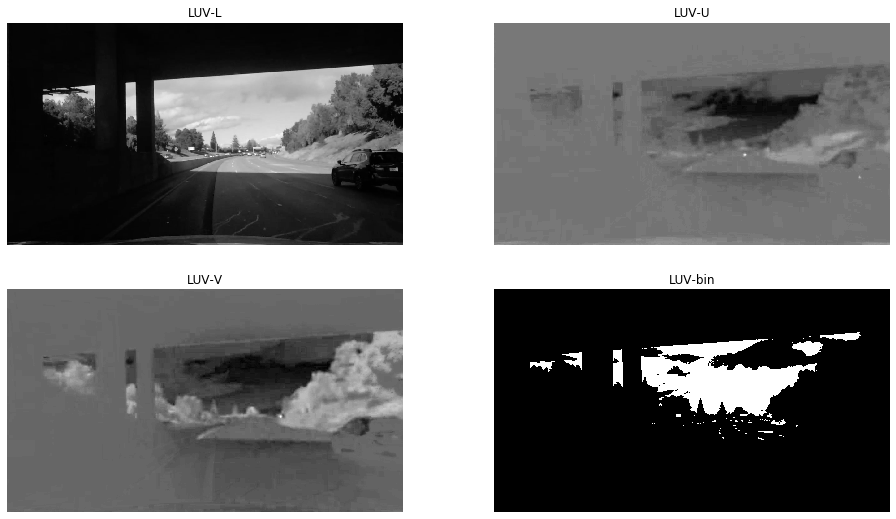

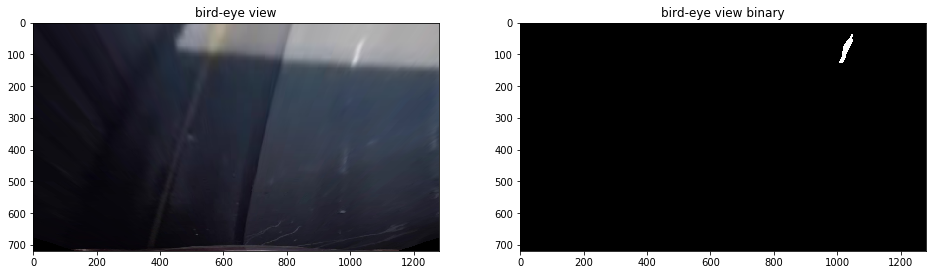

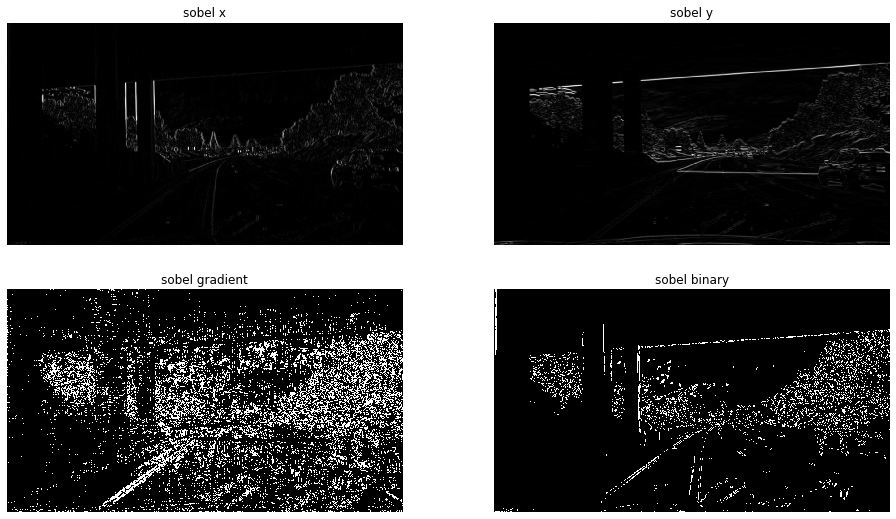

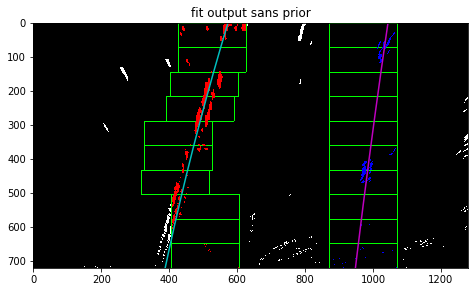

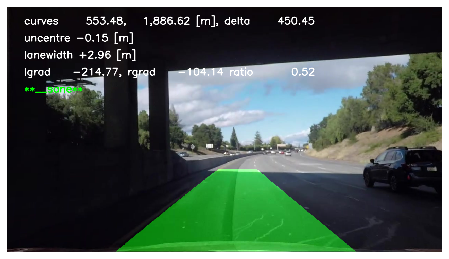

In [12]:
# Verbose test on difficult frame
imtest = mpim.imread(ch_frames[4])
imout = lf.find_lane_lines(imtest, ignore_prior=True, verbose=True)

## Test on difficult challenge frames

Initialising LaneFinder
Calibration complete


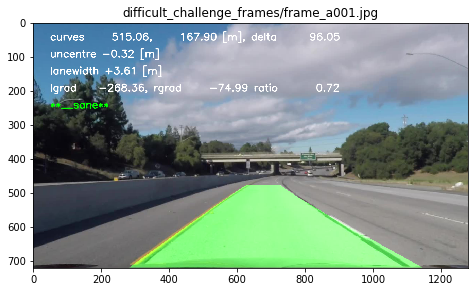

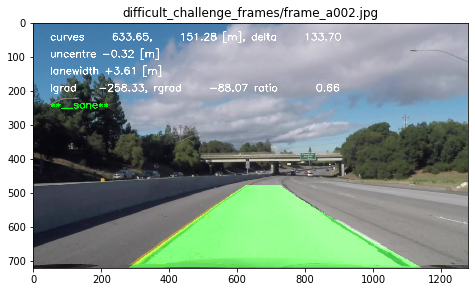

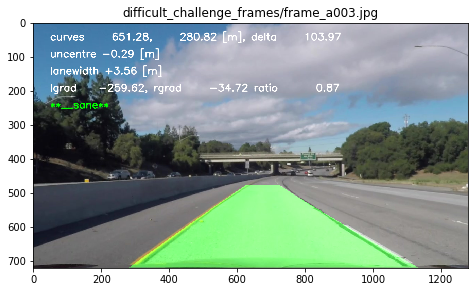

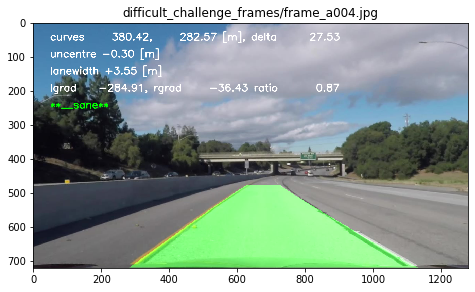

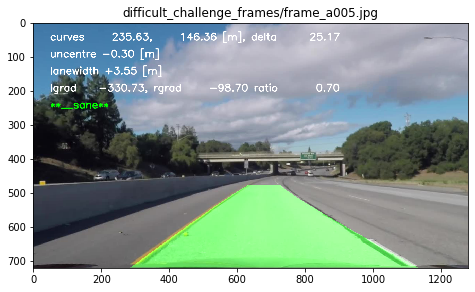

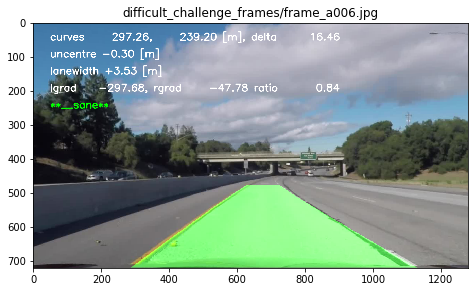

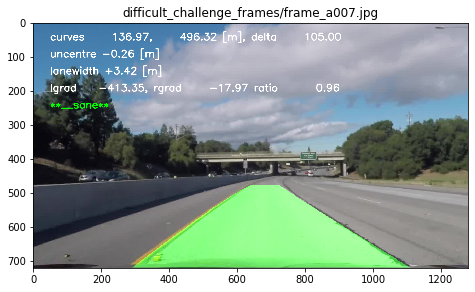

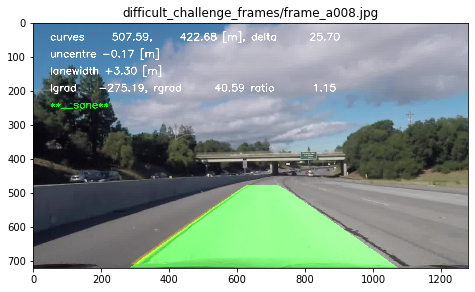

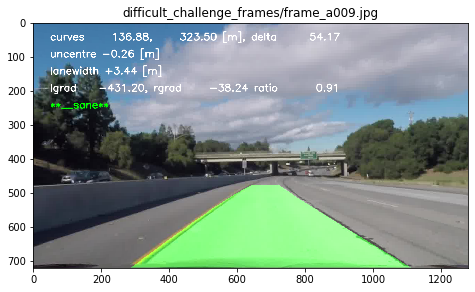

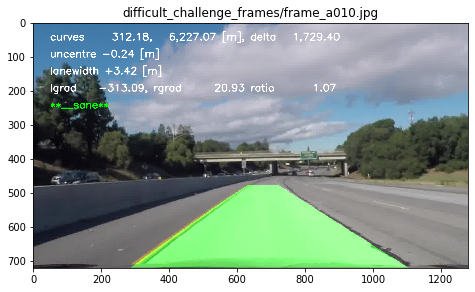

In [20]:
df_ch_dir = 'difficult_challenge_frames'
df_ch_frames = [os.path.join(df_ch_dir, fname) for fname in os.listdir(df_ch_dir)]

lf = LF()
lf.ell_th = (176, 255)
lf.has_prior = False
for fname in df_ch_frames[0::1]:
    im = mpim.imread(fname)
    imout = lf.find_lane_lines(im, ignore_prior=False, verbose=False)
    plt.figure(figsize=(8, 4.5));plt.imshow(imout);plt.gca().set_title(fname)

240 720
dx: 622.0, rt: 0.8885714285714286


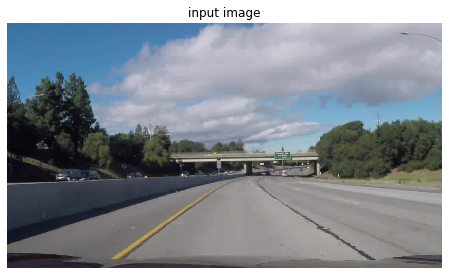

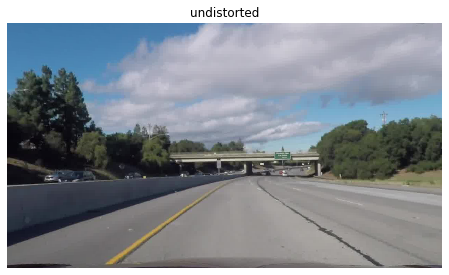

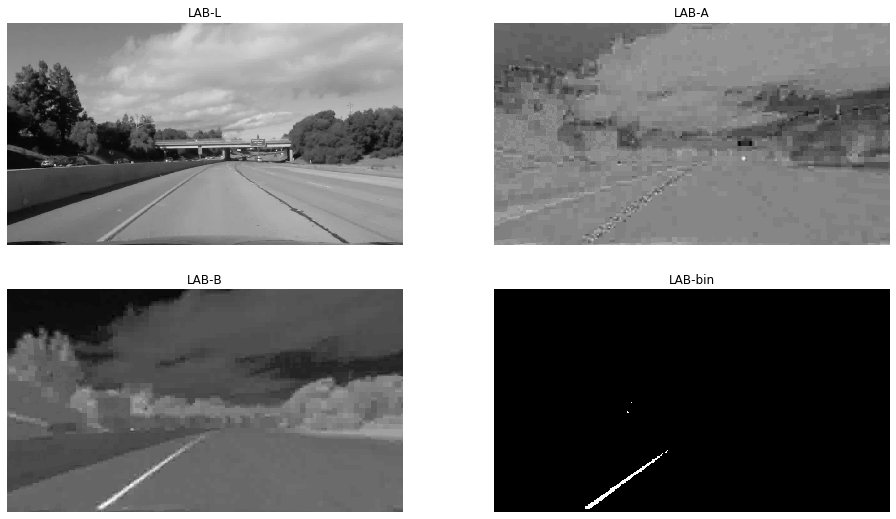

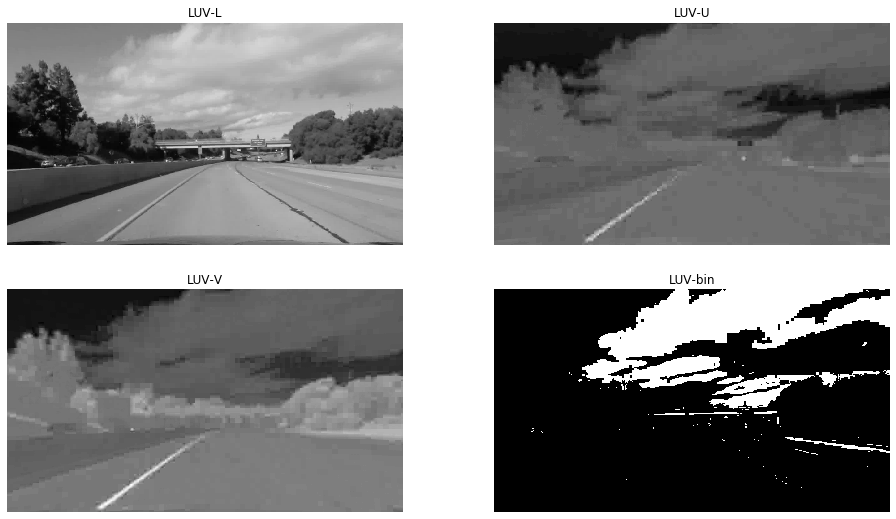

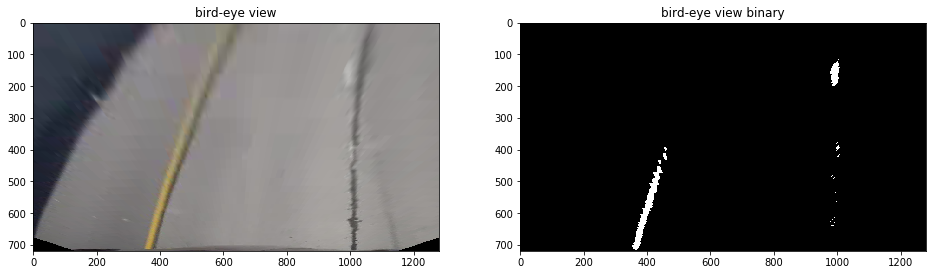

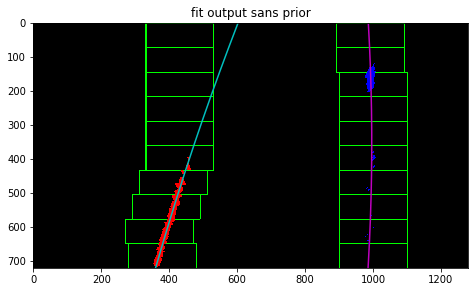

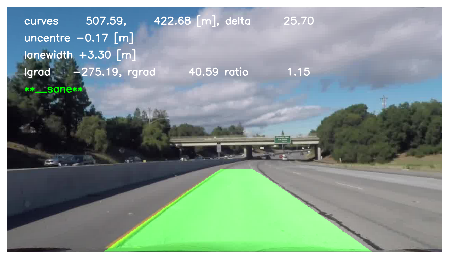

In [21]:
im = mpim.imread(df_ch_frames[7])
imout = lf.find_lane_lines(im, ignore_prior=True, verbose=True)

## Challenge Video 1

In [27]:
vin = 'challenge_video.mp4'
vout = 'vout_challenge.mp4'

lf = LF()
lf.ell_th = (176, 255)
# clipin = VideoFileClip(vin).subclip(0, 5)
clipin = VideoFileClip(vin)
clipout = clipin.fl_image(lf.find_lane_lines)
%time clipout.write_videofile(vout, audio=False)

Initialising LaneFinder
Calibration complete


                                                             


                                                     
                                                           

t:   6%|▋         | 31/485 [09:25<00:50,  8.96it/s, now=None] 


t:  28%|██▊       | 138/485 [09:14<01:49,  3.16it/s, now=None]

                                                             ]


                                                     
                                                           

t:   6%|▋         | 31/485 [09:25<00:50,  8.96it/s, now=None] 


t:  28%|██▊       | 138/485 [09:14<01:49,  3.16it/s, now=None]

t:  28%|██▊       | 138/485 [07:34<01:45,  3.29it/s, now=None]



t:   0%|          | 0/485 [00:00<?, ?it/s, now=None]

Moviepy - Building video vout_challenge.mp4.
Moviepy - Writing video vout_challenge.mp4







t:   1%|          | 3/485 [00:00<00:35, 13.66it/s, now=None]



t:   1%|          | 4/485 [00:00<00:42, 11.27it/s, now=None]



t:   1%|          | 5/485 [00:00<00:45, 10.66it/s, now=None]



t:   1%|          | 6/485 [00:00<00:58,  8.25it/s, now=None]



t:   2%|▏         | 8/485 [00:00<00:56,  8.51it/s, now=None]



t:   2%|▏         | 9/485 [00:00<00:54,  8.66it/s, now=None]



t:   2%|▏         | 11/485 [00:01<00:53,  8.88it/s, now=None]



t:   3%|▎         | 13/485 [00:01<00:53,  8.80it/s, now=None]



t:   3%|▎         | 14/485 [00:01<00:51,  9.09it/s, now=None]



t:   3%|▎         | 15/485 [00:01<00:55,  8.49it/s, now=None]



t:   3%|▎         | 16/485 [00:01<00:57,  8.17it/s, now=None]



t:   4%|▎         | 17/485 [00:01<01:04,  7.29it/s, now=None]



t:   4%|▍         | 19/485 [00:02<00:59,  7.85it/s, now=None]



t:   4%|▍         | 20/485 [00:02<00:56,  8.29it/s, now=None]



t:   4%|▍         | 21/485 [00:02<01:00,  7.66it/s, now=None]



t:   5%|▍         | 23/485 

t:  29%|██▉       | 141/485 [00:18<01:00,  5.71it/s, now=None]



t:  29%|██▉       | 142/485 [00:18<01:18,  4.36it/s, now=None]



t:  29%|██▉       | 143/485 [00:18<01:16,  4.46it/s, now=None]



t:  30%|██▉       | 144/485 [00:19<01:14,  4.58it/s, now=None]



t:  30%|██▉       | 145/485 [00:19<01:25,  3.98it/s, now=None]



t:  30%|███       | 146/485 [00:19<01:26,  3.91it/s, now=None]



t:  30%|███       | 147/485 [00:19<01:20,  4.19it/s, now=None]



t:  31%|███       | 148/485 [00:20<01:18,  4.27it/s, now=None]



t:  31%|███       | 149/485 [00:20<01:29,  3.76it/s, now=None]



t:  31%|███       | 150/485 [00:20<01:28,  3.80it/s, now=None]



t:  31%|███       | 151/485 [00:20<01:33,  3.55it/s, now=None]



t:  31%|███▏      | 152/485 [00:21<01:30,  3.69it/s, now=None]



t:  32%|███▏      | 153/485 [00:21<01:26,  3.82it/s, now=None]



t:  32%|███▏      | 154/485 [00:21<01:38,  3.34it/s, now=None]



t:  32%|███▏      | 155/485 [00:21<01:23,  3.94it/s, now=None]



t:  32%|██

t:  54%|█████▎    | 260/485 [00:38<00:32,  6.90it/s, now=None]



t:  54%|█████▍    | 261/485 [00:38<00:32,  6.98it/s, now=None]



t:  54%|█████▍    | 262/485 [00:38<00:31,  7.19it/s, now=None]



t:  54%|█████▍    | 263/485 [00:38<00:32,  6.80it/s, now=None]



t:  54%|█████▍    | 264/485 [00:39<00:34,  6.44it/s, now=None]



t:  55%|█████▍    | 265/485 [00:39<00:33,  6.55it/s, now=None]



t:  55%|█████▍    | 266/485 [00:39<00:33,  6.55it/s, now=None]



t:  55%|█████▌    | 267/485 [00:39<00:30,  7.08it/s, now=None]



t:  55%|█████▌    | 268/485 [00:39<00:28,  7.55it/s, now=None]



t:  55%|█████▌    | 269/485 [00:39<00:26,  8.12it/s, now=None]



t:  56%|█████▌    | 271/485 [00:39<00:23,  9.26it/s, now=None]



t:  56%|█████▋    | 273/485 [00:40<00:25,  8.23it/s, now=None]



t:  56%|█████▋    | 274/485 [00:40<00:26,  7.83it/s, now=None]



t:  57%|█████▋    | 275/485 [00:40<00:26,  7.90it/s, now=None]



t:  57%|█████▋    | 276/485 [00:40<00:30,  6.76it/s, now=None]



t:  57%|██

t:  83%|████████▎ | 402/485 [00:56<00:13,  6.37it/s, now=None]



t:  83%|████████▎ | 404/485 [00:56<00:10,  7.59it/s, now=None]



t:  84%|████████▎ | 406/485 [00:56<00:09,  8.70it/s, now=None]



t:  84%|████████▍ | 408/485 [00:56<00:09,  7.71it/s, now=None]



t:  84%|████████▍ | 409/485 [00:57<00:11,  6.74it/s, now=None]



t:  85%|████████▍ | 411/485 [00:57<00:10,  6.95it/s, now=None]



t:  85%|████████▌ | 413/485 [00:57<00:09,  7.97it/s, now=None]



t:  86%|████████▌ | 415/485 [00:57<00:08,  7.87it/s, now=None]



t:  86%|████████▌ | 417/485 [00:58<00:09,  7.33it/s, now=None]



t:  86%|████████▋ | 419/485 [00:58<00:08,  7.37it/s, now=None]



t:  87%|████████▋ | 421/485 [00:58<00:07,  8.16it/s, now=None]



t:  87%|████████▋ | 422/485 [00:58<00:07,  8.31it/s, now=None]



t:  87%|████████▋ | 423/485 [00:58<00:07,  8.17it/s, now=None]



t:  88%|████████▊ | 425/485 [00:59<00:06,  9.56it/s, now=None]



t:  88%|████████▊ | 427/485 [00:59<00:07,  8.25it/s, now=None]



t:  88%|██

Moviepy - Done !
Moviepy - video ready vout_challenge.mp4
CPU times: user 2min 39s, sys: 46.7 s, total: 3min 26s
Wall time: 1min 7s


## Test on harder challenge video frames

In [ ]:
ha_dir = 'harder_frames'
ha_frames = [os.path.join(ha_dir, fname) for fname in os.listdir(ha_dir)]

lf = LF()
lf.has_prior = False
for fname in ha_frames[::10]:
    im = mpim.imread(fname)
    imout = lf.find_lane_lines(im, ignore_prior=True, verbose=False)
    plt.figure(figsize=(8, 4.5));plt.imshow(imout);plt.gca().set_title(fname)

In [ ]:
# Verbose test on difficult frame
imtest = mpim.imread(ha_frames[40])
imout = lf.find_lane_lines(imtest, ignore_prior=True, verbose=True)

## Challenge Video 2

In [ ]:
vin = 'harder_challenge_video.mp4'
vout = 'vout_harder.mp4'

lf = LF()
# clipin = VideoFileClip(vin).subclip(0, 5)
clipin = VideoFileClip(vin)
clipout = clipin.fl_image(lf.find_lane_lines)
%time clipout.write_videofile(vout, audio=False)